#### ML HW2 Xinmeng Zhang

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import pandas as pd

In [2]:
import json
speeches=[]
with open('speeches.json') as f:
    for line in f:
        speeches.append(json.loads(line))

In [3]:
df = pd.DataFrame.from_dict(speeches, orient='columns')
df.describe()

,president,text,year
count,226,226,226
unique,41,226,223
top,Franklin D. Roosevelt,Fellow-Citizens of the Senate and House of Re...,1981
freq,12,1,2


### Question 3 Analysis of SOU similarities

In this part we will use the ***vector space model*** to find similar SOU addresses. 

In the vector space model, a document of words $d$ is represented by a ``TF-IDF`` vector $\mathbf{t}(d) = (t_1(d), t_2(d), \dots, t_V(d))$ of length V, where V is the total number of words in the vocabulary. The `` TF-IDF`` weights are given by:

\begin{equation}
t_i(d) = n_i(d) \log \left( \frac{|\cal{D}|}{\sum_{d' \in D} \mathbf{1}(v_i \in d')}\right)
\end{equation}

where $n_i(d)$ is the number of times term $v_i$ appears in document $d$, $\sum_{d' \in D} \mathbf{1}$ is the number of documents that contain term $v_i$, and $|\cal{D}|$ is the total number of documents in the collection $\cal{D}$. This weighting scheme favors terms that apppear in a few documents.

#### (a) Preprocessing and creation of `TF-IDF` vectors
Compute the tf-idf vectors for each SOU address. You should lower case all
of the text, and remove punctuation. You will have to make choices about the size of the term vocabulary to use, for
example throwing out the 20 most common words, and words that appear fewer
than, say, 50 times, and removing numbers.

In [4]:
import nltk
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
stopWords = stopwords.words('english')

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\feature_extraction\image.py:167: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype=np.int):


Let's first look at the most common 20 words.

In [5]:
import string
import re
from collections import Counter

def clean_and_split(s):
    
    # string.punctuation is a string with all the different punctuation symbols.
    # 'tr' is an object that will assign blank space to each punctuation symbol.

    tr=str.maketrans(string.punctuation," "*len(string.punctuation))
    s=s.lower().translate(tr)
    # replace \r\n
    s = re.sub('(\r\n)+',' ',s)
    # replace whitespace substrings with one whitespace and remove leading/trailing whitespaces
    s = re.sub(' +',' ',s.strip())
    s=s.split(' ')

    return s

# Create a list of list including all the words from each address
word = []
for i in range(226):
    sou_add_loc = df.at[i, "text"]
    pre_processed = clean_and_split(sou_add_loc)
    word.append(pre_processed)

# Create a dictionary counting the frequency of words appeared in all addresses.
frequency = {}

# iterating over address
for address in word:
   # iterating over each word in one address
   for item in address:
      # checking the element in dictionary
      if item in frequency:
         # incrementing the counr
         frequency[item] += 1
      else:
         # initializing the count
         frequency[item] = 1

# Sort the frequency dictionary by frequency
sorted_word = sorted(frequency.items(), key=lambda x:x[1], reverse=True)
converted_dict = dict(sorted_word)
word_by_frequency = list(converted_dict.keys())
print(word_by_frequency[0:20])

['the', 'of', 'to', 'and', 'in', 'a', 'that', 'for', 'be', 'is', 'our', 'it', 'by', 'which', 'as', 'this', 'with', 'we', 'have', 'i']


Now incorporate eliminating the most common 20 words and words that appeared less than 50 times into the function.

In [6]:
def clean_and_split1(s):
    
    # string.punctuation is a string with all the different punctuation symbols.
    # 'tr' is an object that will assign blank space to each punctuation symbol.
    
    common_words = ['the', 'of', 'to', 'and', 'in', 'a', 'that', 'for', 'be', 
                    'our', 'is', 'it', 'by', 'which', 'we', 'this', 'as', 'with', 'have', 'been']

    tr=str.maketrans(string.punctuation," "*len(string.punctuation))
    s=s.lower().translate(tr)
    # replace \r\n
    s = re.sub('(\r\n)+',' ',s)
    # replace whitespace substrings with one whitespace and remove leading/trailing whitespaces
    s = re.sub(' +',' ',s.strip())
    s=s.split(' ')

    s = [word for word in s if word not in common_words and len(word) > 1 and not word.isdigit()]
    word_counts = Counter(s)
    s = [word for word in s if word_counts[word] >= 50]
    return s

In [7]:
# Create a list of list including all the words from each address
word1 = []
for i in range(226):
    sou_add_loc1 = df.at[i, "text"]
    pre_processed1 = clean_and_split1(sou_add_loc1)
    word1.append(pre_processed1)

In [8]:
import math

def tf_idf(word_list, corpus):
    """
    Calculate the TF-IDF vector of a document given the corpus.
    
    Parameters:
    -----------
    word_list: list
        List of words in the document.
    
    corpus: list of list
        List of all documents in the corpus. Each document is represented as a list of words.
    
    Returns:
    --------
    list
        TF-IDF vector of the document.
    """
    tfidf_vector = []
    N = len(corpus)  # total number of documents in the corpus
    for term in word_list:
        ni = word_list.count(term) # term frequency in the document
        df = sum([1 for document in corpus if term in document])  # document frequency of the term
        idf = math.log(N / df) if df != 0 else 0  # inverse document frequency
        tfidf = ni * idf  # tf-idf score
        tfidf_vector.append(tfidf)
    return tfidf_vector


In [9]:
# The outcome should be a list of list where each sublist is the TF-IDF of each word in one address. 
# And there are len(tfidf_vectors) = 226 sublist.
tfidf_vectors = []
for doc in word1:
    tfidf_vectors.append(tf_idf(doc, word1))

#### (b)
A similarity measure between documents is
\begin{equation}
\textrm{sim}(d,d') = \frac{\mathbf{t}(d)\cdot \mathbf{t}(d')}{|| \mathbf{t}(d)||\, || \mathbf{t}(d')||},
\end{equation}

the cosine of the angle between the corresponding tf-idf vectors. In terms of this measure, finnd the
- 50 most similar pairs of SOUs given by different Presidents.
- 50 most similar pairs of SOUs given by the same President.
- 25 most similar pairs of Presidents, averaging the cosine similarity over all
pairs of their SOUs.

When you read the above speeches, do they indeed seem similar to you? Comment on what you find, and describe what is needed to construct a better similarity measure between documents.

In [37]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Define the parameters for the TfidfVectorizer
tfidf = TfidfVectorizer(lowercase=True, stop_words='english', strip_accents='unicode',
                        token_pattern=r'\b[a-zA-Z]{3,}\b', max_df=0.95, min_df=50)

# Fit and transform the SOU addresses
tfidf_vectors = tfidf.fit_transform(df['text'])

# Calculate cosine similarities between all pairs of SOUs
cosine_similarities = cosine_similarity(tfidf_vectors)

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [29]:
# Find the 50 most similar pairs of SOUs given by different Presidents
sou_indices = df['president'].groupby(level=0, sort=False).first().index.values
similar_sou_pairs = []
for i in range(len(sou_indices)):
    for j in range(i+1, len(sou_indices)):
        if i != j:
            sou_pair = (sou_indices[i], sou_indices[j])
            similarity = cosine_similarities[i:i+1,j:j+1][0][0]
            similar_sou_pairs.append((sou_pair, similarity))
            
similar_sou_pairs = sorted(similar_sou_pairs, key=lambda x: x[1], reverse=True)[:50]

top_50_diff = []
for element in similar_sou_pairs:
    top_50_diff.append(element[0])
print(top_50_diff)

[(60, 138), (48, 222), (186, 191), (48, 66), (7, 24), (48, 57), (119, 151), (57, 222), (7, 165), (104, 151), (11, 88), (24, 113), (23, 24), (7, 35), (22, 138), (24, 165), (5, 85), (107, 119), (104, 119), (191, 207), (57, 66), (61, 202), (7, 113), (91, 138), (107, 151), (22, 60), (92, 147), (24, 35), (50, 71), (5, 225), (72, 157), (60, 91), (72, 134), (88, 167), (35, 165), (106, 111), (11, 167), (152, 182), (187, 206), (66, 222), (35, 65), (19, 202), (43, 85), (66, 210), (197, 213), (104, 107), (22, 38), (23, 165), (7, 65), (113, 165)]


In [179]:
# Find the indices of the documents given by the same President
president_indices = {}
for i in range(len(df)):
    president = df.iloc[i]['president']
    if president in president_indices:
        president_indices[president].append(i)
    else:
        president_indices[president] = [i]

# Calculate cosine similarities only between documents given by the same President
cosine_similarities = cosine_similarity(tfidf_vectors)
same_president_similarities = []
for president, indices in president_indices.items():
    for i, index1 in enumerate(indices[:-1]):
        for index2 in indices[i+1:]:
            same_president_similarities.append((index1, index2, cosine_similarities[index1, index2]))

# Sort the pairs by cosine similarity
same_president_similarities.sort(key=lambda x: x[2], reverse=True)

# Print the top 50 similar pairs
for i in range(50):
    pair = same_president_similarities[i]
    print(f"{df.iloc[pair[0]]['president']}, {df.iloc[pair[0]]['year']}: {df.iloc[pair[0]]['text'][:100]}...")
    print(f"{df.iloc[pair[1]]['president']}, {df.iloc[pair[1]]['year']}: {df.iloc[pair[1]]['text'][:100]}...")
    print(f"Cosine similarity: {pair[2]}\n")

Barack Obama, 2013: Mr. Speaker, Mr. Vice President, members of Congress, distinguished guests and fellow Americans:

La...
Barack Obama, 2012: Mr. Speaker, Mr. Vice President, Members of Congress, distinguished guests, and fellow Americans: La...
Cosine similarity: 0.9925673777772186

William J. Clinton, 1998: The President. 

Mr. Speaker, Mr. Vice President, Members of the 105th Congress, distinguished gue...
William J. Clinton, 2000: Mr. Speaker, Mr. Vice President, Members of Congress, honored guests, my fellow Americans: 

We ar...
Cosine similarity: 0.8186105101896913

William McKinley, 1900:  To the Senate and House of Representatives:

 

At the outgoing of the old and the incoming of ...
William McKinley, 1899:  To the Senate and House of Representatives:

 

At the threshold of your deliberations you are ...
Cosine similarity: 0.8157824593016286

William J. Clinton, 1998: The President. 

Mr. Speaker, Mr. Vice President, Members of the 105th Congress, distinguished gue...
Wil

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [14]:
# Find the 25 most similar pairs of Presidents
from itertools import combinations

presidents = df['president'].unique()
pres_similarities = np.zeros((len(presidents), len(presidents)))

for i, pres1 in enumerate(presidents):
    for j, pres2 in enumerate(presidents):
        if i >= j:
            continue
        speeches1 = df.loc[df['president'] == pres1, 'text']
        speeches2 = df.loc[df['president'] == pres2, 'text']
        tfidf_vectors1 = tfidf.transform(speeches1)
        tfidf_vectors2 = tfidf.transform(speeches2)
        similarities = cosine_similarity(tfidf_vectors1, tfidf_vectors2)
        pres_similarities[i, j] = similarities.mean()
        
indices = np.argpartition(pres_similarities, -25, axis=None)[-25:]
pairs = [(presidents[i // len(presidents)], presidents[i % len(presidents)]) for i in indices if i // len(presidents) < i % len(presidents)]
similarities = pres_similarities.flatten()[indices][[i for i in range(len(indices)) if indices[i] // len(presidents) < indices[i] % len(presidents)]]
result = sorted(zip(pairs, similarities), key=lambda x: x[1], reverse=True)


d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairw

In [15]:
result

[(('Millard Fillmore', 'Zachary Taylor'), 0.6480749316394192),
 (('Rutherford B. Hayes', 'Chester A. Arthur'), 0.6373786742377852),
 (('Benjamin Harrison', 'Rutherford B. Hayes'), 0.6266699506490454),
 (('Theodore Roosevelt', 'William Howard Taft'), 0.6222878234703201),
 (('Barack Obama', 'William J. Clinton'), 0.620923620725697),
 (('Benjamin Harrison', 'William Howard Taft'), 0.6169697466332631),
 (('Benjamin Harrison', 'Chester A. Arthur'), 0.6118702147461237),
 (('William McKinley', 'William Howard Taft'), 0.6109457142907069),
 (('Chester A. Arthur', 'William Howard Taft'), 0.6068846169392141),
 (('James Buchanan', 'Zachary Taylor'), 0.6045202274802011),
 (('Martin Van Buren', 'Andrew Jackson'), 0.5963801612611046),
 (('Rutherford B. Hayes', 'William Howard Taft'), 0.5890736194201946),
 (('Grover Cleveland', 'Rutherford B. Hayes'), 0.5880430002448489),
 (('Ulysses S. Grant', 'Rutherford B. Hayes'), 0.587117197594343),
 (('Grover Cleveland', 'Benjamin Harrison'), 0.5835523409097997)

#### (c)
Using this vector representation, cluster the speeches using k-means. The options here limit the number of iterations of kmeans to 50, the number of clusters to 10, the clusters are initialized randomly.

Experiment with different number of clusters, and display the clusters obtained (in
some manner that you choose). Comment on the clustering results, and whether
or not the results are interpretable.

In [38]:
from sklearn.cluster import KMeans

In [40]:
n_clust = np.arange(1,61) # Array of number of clusters
distortions = np.zeros(len(n_clust))

dense_vectors = tfidf_vectors.todense()
denselist = np.asarray(dense_vectors.tolist())

for i in range(len(n_clust)):
    n_clust_loc = n_clust[i]
    km_model = KMeans(n_clusters=n_clust_loc,
                     init='k-means++',
                     n_init=10,
                     max_iter=50,
                     random_state=0)
    km_model.fit(denselist)
    distortions[i] = km_model.inertia_

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairw

In [41]:
km_model = KMeans(n_clusters=8,
                     init='k-means++',
                     n_init=10,
                     max_iter=50,
                     random_state=0)
km_model.fit(denselist)

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairw

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=50,
    n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=0, tol=0.0001, verbose=0)

In [42]:
clust = km_model.predict(denselist)

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [43]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
# Transform dataset, project in two dimensions
transf = pca.fit_transform(denselist)

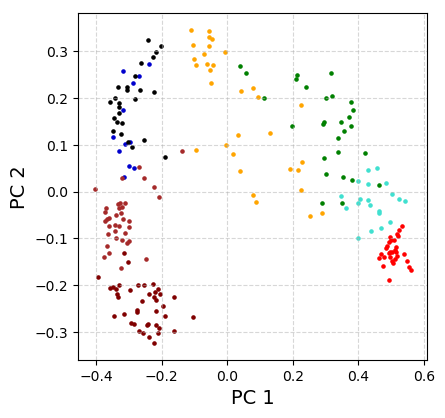

In [45]:
dim_1 = transf[:,0]
dim_2 = transf[:,1]
plt.figure(figsize=(4.5, 4.5))

plt.scatter(dim_1[clust==0],dim_2[clust==0], color='mediumblue',s=5.2)
plt.scatter(dim_1[clust==1],dim_2[clust==1], color='red',s=5.2)
plt.scatter(dim_1[clust==2],dim_2[clust==2], color='green',s=5.2)
plt.scatter(dim_1[clust==3],dim_2[clust==3], color='orange',s=5.2)
plt.scatter(dim_1[clust==4],dim_2[clust==4], color='k',s=5.2)
plt.scatter(dim_1[clust==5],dim_2[clust==5], color='maroon',s=5.2)
plt.scatter(dim_1[clust==6],dim_2[clust==6], color='turquoise',s=5.2)
plt.scatter(dim_1[clust==7],dim_2[clust==7], color='brown',s=5.2)

plt.grid(ls='--',alpha=0.5)
plt.xlabel('PC 1', fontsize=14);plt.ylabel('PC 2', fontsize=14)
plt.show()

When there are seven clusters we see there's overlap over the entire range and thus it might not be a good idea

#### (d)
Now try performing spectral clustering using the tf-idf vectors. Compute the
matrix A of distances between pairs of vectors and then compute $\tilde W$ as defined in
class. A rule of thumb for the bandwidth h is to use the mean of A, but you should
experiment with a few values around that as well. Its a good idea to compute A
ahead of time, and then get W=exp(-A/h) for di↵erent values of h.

##### (i) Plot the top 30 eigenvalues of $\tilde{W}$, (the top eigenvalue should be 1.)

In [155]:
from sklearn.metrics.pairwise import cosine_distances
A = cosine_distances(tfidf_vectors)
h = np.mean(A)
W = np.exp(-A / h)

d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [169]:
# Compute the normalized graph Laplacian L and its eigendecomposition
D = np.diag(np.sum(W, axis=1))
D_sqrt_inv = np.diag(1 / np.sqrt(np.diag(D)))
L = D_sqrt_inv @ W @ D_sqrt_inv
eigenvalues, eigenvectors = np.linalg.eigh(L)

# Compute the top 30 eigenvectors and form the matrix W tilde
W_tilde = eigenvectors[:, -30:]


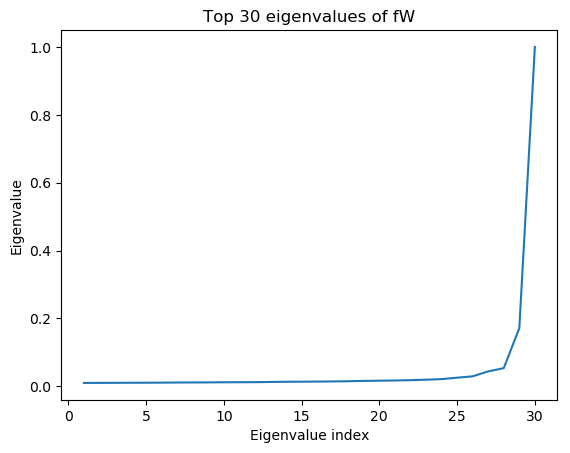

In [170]:
# Plot the top 30 eigenvalues of fW
import matplotlib.pyplot as plt
plt.plot(np.arange(1, 31), eigenvalues[-30:])
plt.xlabel('Eigenvalue index')
plt.ylabel('Eigenvalue')
plt.title('Top 30 eigenvalues of fW')
plt.show()

##### (ii) Take top three eigenvectors $u_1, u_2, u_3$ multiply them on the left by $D^{−1/2}: v_i = D^{−1/2}u_i$, and plot the three vectors. The first should be constant corresponding to the eigenvalue 1.

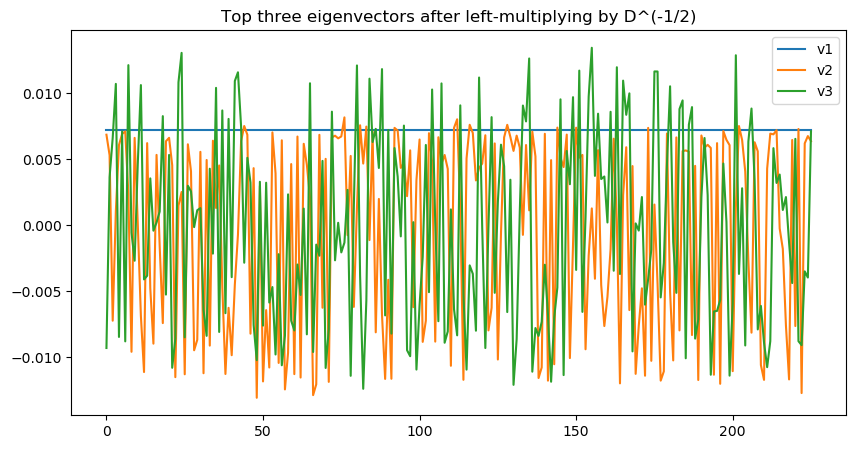

In [171]:
from scipy.sparse.linalg import eigsh

# Compute the top three eigenvectors of L
#vals, vecs = eigsh(L, k=3, which='SM')

vecs = eigenvectors[:, -3:]
vals = eigenvalues[-3:]

# Compute the corresponding vectors after left-multiplying by D^(-1/2)
D_sqrt_inv = np.diag(np.sqrt(1 / D.diagonal()))
v3, v2, v1 = np.transpose(D_sqrt_inv @ vecs)

# Plot the three vectors
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(v1, label='v1')
ax.plot(v2, label='v2')
ax.plot(v3, label='v3')
ax.set_title('Top three eigenvectors after left-multiplying by D^(-1/2)')
ax.legend()
plt.show()

##### (iii) Plot a scatter plot of $v_2, v_3$, and describe what you observe. Why do you think the scatter plot looks like this?

Text(0.5, 1.0, 'Top Three Eigenvectors after Left-Multiplying by D^(-1/2)')

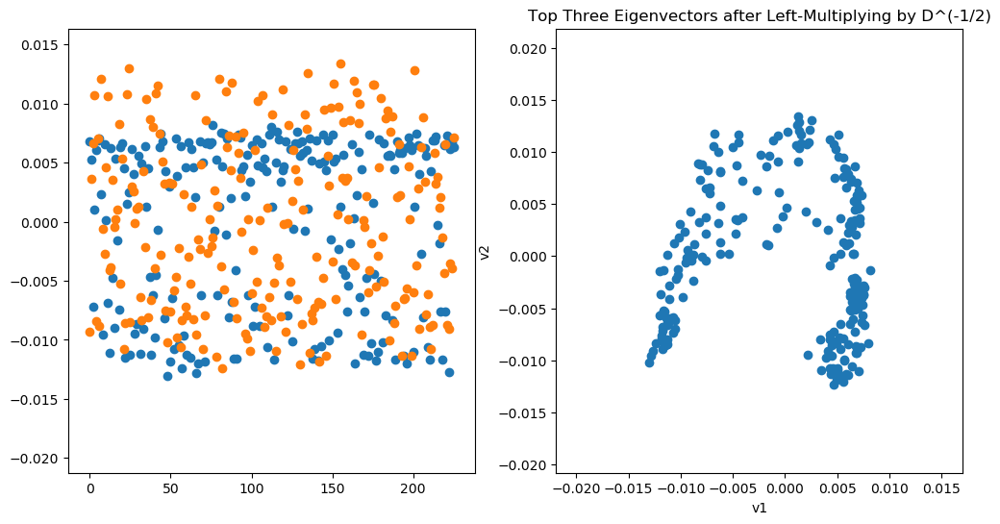

In [172]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1) # row 1, col 2 index 1

plt.scatter(range(len(v2)), v2) #blue
plt.scatter(range(len(v3)), v3) #orange

plt.subplot(1, 2, 2) # row 1, col 2 index 2
plt.scatter(v2,v3)
plt.xlabel('v1')
plt.ylabel('v2')
plt.title('Top Three Eigenvectors after Left-Multiplying by D^(-1/2)')


We only look at v2 and v3 because v1 is 1 unchanged and thus not very interesting to look at. Looking at he graph we see taht v1 and v2 formed a U shape when we plot them together. The U shape in the plot of v2 and v3 suggests that there may be two distinct groups or clusters in the data. This is because spectral clustering is a technique used to identify community structure in a graph or dataset, and the eigenvalues and eigenvectors that are computed correspond to these communities. If the data naturally falls into two distinct groups, then it is likely that the top two eigenvectors will reveal this structure, leading to a U shape in the plot of v1 and v2.

##### (iii) Another possibility is to do the spectral clustering on the unit length vectors: $\frac{\mathbf{t}(d)}{|| \mathbf{t}(d)||}$. Perform the same spectral analysis as before, and have the year of each dot printed next to it (you will need a larger figure, so use the command: plt.figure(figsize=(10,10)).) What do you observe in this spectral projection? Why is the analysis of the unit length vectors so di↵erent from theanalysis of the original vectors?

In [149]:
from sklearn.preprocessing import normalize

tfidf_norm = normalize(tfidf_vectors, norm='l2', axis=1)

In [173]:
from sklearn.metrics.pairwise import euclidean_distances

distances = euclidean_distances(tfidf_norm, tfidf_norm)
sigma = np.mean(distances)
W = np.exp(-distances**2 / sigma**2)


d:\anaconda3\envs\cse160\lib\site-packages\sklearn\metrics\pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [178]:
D = np.diag(np.sum(W, axis=1))
D_sqrt_inv = np.sqrt(np.linalg.inv(D))
L = D_sqrt_inv @ (D - W) @ D_sqrt_inv


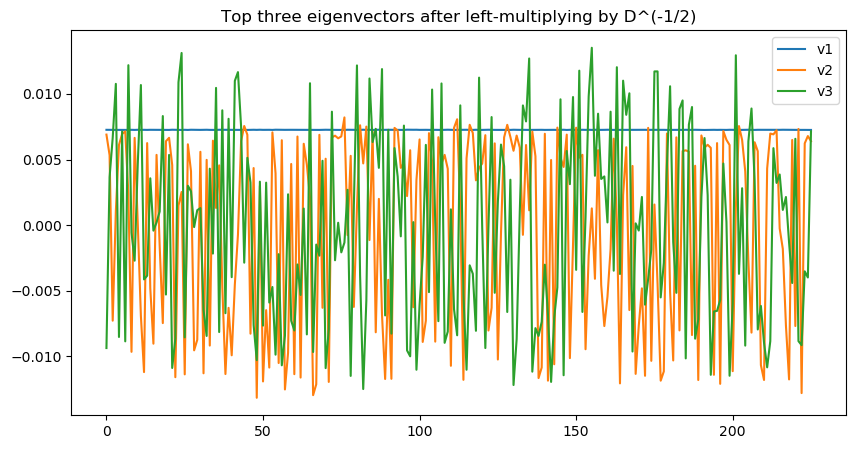

In [177]:
from scipy.sparse.linalg import eigsh

vecs = eigenvectors[:, -3:]
vals = eigenvalues[-3:]

# Compute the corresponding vectors after left-multiplying by D^(-1/2)
D_sqrt_inv = np.diag(np.sqrt(1 / D.diagonal()))
v3, v2, v1 = np.transpose(D_sqrt_inv @ vecs)

# Plot the three vectors
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(v1, label='v1')
ax.plot(v2, label='v2')
ax.plot(v3, label='v3')
ax.set_title('Top three eigenvectors after left-multiplying by D^(-1/2)')
ax.legend()
plt.show()